# Import libraries

In [262]:
from pathlib import Path
import pandas as pd
import numpy as np
import re
import os
import copy
from datetime import datetime, timedelta
import matplotlib.pyplot as plt
import matplotlib.dates as md
from scipy import stats
# from create_dataset.CreateDataset import CreateDataset
# from util.VisualizeDataset import VisualizeDataset
from util import util
from sklearn.mixture import GaussianMixture
from scipy.signal import buttord, butter, lfilter, filtfilt
from sklearn.decomposition import PCA, FastICA

### Step 1: Create Dataset
* Aggregate the data with average value each 100 miliseconds
* Set labels 1 (for left) or 2 (for right) or 3 (relaxing).\
As the person is looking at the bottle at the left side and think about taking it; then the person is doing the same withe right hand & sometimes he/she sit staring straight in front ;)

#### Set pathes

In [140]:
FOLDER_PATH = Path('./datasets/motor_imagery/')
RESULT_PATH = Path('./intermediate_datafiles/motor_imagery/step1_result/')
RESULT_PATH.mkdir(exist_ok=True, parents=True)
GRANULARITY = 100 # milisecond per instance; we settle at 100 ms.

#### See an example

In [191]:
instance_path = [i for i in os.scandir(FOLDER_PATH)][0].path
df_instance = pd.read_csv(instance_path, skipinitialspace=True)
df_instance.drop(df_instance.columns[21:-1], axis=1, inplace=True)
df_instance.head()

,TimeStamp,Delta_TP9,Delta_AF7,Delta_AF8,Delta_TP10,Theta_TP9,Theta_AF7,Theta_AF8,Theta_TP10,Alpha_TP9,...,Alpha_TP10,Beta_TP9,Beta_AF7,Beta_AF8,Beta_TP10,Gamma_TP9,Gamma_AF7,Gamma_AF8,Gamma_TP10,Elements
0,2021-08-26 18:45:49.518,0.529532,1.062243,0.672268,0.406634,0.563284,0.510825,0.157816,0.257729,0.33745,...,0.323527,0.523984,0.039001,-0.104368,0.236278,-0.139713,-0.25584,-0.412144,0.013563,NaN
1,2021-08-26 18:45:49.519,0.529532,1.062243,0.672268,0.406634,0.563284,0.510825,0.157816,0.257729,0.33745,...,0.323527,0.523984,0.039001,-0.104368,0.236278,-0.139713,-0.25584,-0.412144,0.013563,NaN
2,2021-08-26 18:45:49.520,0.529532,1.062243,0.672268,0.406634,0.563284,0.510825,0.157816,0.257729,0.33745,...,0.323527,0.523984,0.039001,-0.104368,0.236278,-0.139713,-0.25584,-0.412144,0.013563,NaN
3,2021-08-26 18:45:49.520,0.529532,1.062243,0.672268,0.406634,0.563284,0.510825,0.157816,0.257729,0.33745,...,0.323527,0.523984,0.039001,-0.104368,0.236278,-0.139713,-0.25584,-0.412144,0.013563,NaN
4,2021-08-26 18:45:49.521,0.529532,1.062243,0.672268,0.406634,0.563284,0.510825,0.157816,0.257729,0.33745,...,0.323527,0.523984,0.039001,-0.104368,0.236278,-0.139713,-0.25584,-0.412144,0.013563,NaN


In [192]:
result_instance_path = str(RESULT_PATH) + '/' + instance_path.split('/')[-1]
result_instance_path

'intermediate_datafiles/motor_imagery/step1_result/med_2021-08-26--18-45-49_174012250194033688.csv'

#### Explain labels

In [193]:
lst = []
for i in range(0, len(df_instance.index)):
    lst.append(df_instance.loc[i, 'Elements'])

set(lst)

{'/Marker/1', '/Marker/2', '/Marker/3', '/muse/elements/blink', nan}

In [194]:
left_labels, right_labels = [], []
label = 0
labels = []

df_instance['TimeStamp'] = pd.to_datetime(df_instance['TimeStamp'])
for i in range(0, len(df_instance.index)):
    i_value = df_instance.loc[i, 'Elements']
    if type(i_value) == str and i_value.startswith('/Marker/'):
        label = int(i_value[-1])
    labels.append(label)

In [195]:
label_series = pd.Series(labels)
df = pd.get_dummies(label_series)
df_instance['left'], df_instance['right'] = df[1], df[2]
df_instance.head(3)

,TimeStamp,Delta_TP9,Delta_AF7,Delta_AF8,Delta_TP10,Theta_TP9,Theta_AF7,Theta_AF8,Theta_TP10,Alpha_TP9,...,Beta_AF7,Beta_AF8,Beta_TP10,Gamma_TP9,Gamma_AF7,Gamma_AF8,Gamma_TP10,Elements,left,right
0,2021-08-26 18:45:49.518,0.529532,1.062243,0.672268,0.406634,0.563284,0.510825,0.157816,0.257729,0.33745,...,0.039001,-0.104368,0.236278,-0.139713,-0.25584,-0.412144,0.013563,NaN,0,0
1,2021-08-26 18:45:49.519,0.529532,1.062243,0.672268,0.406634,0.563284,0.510825,0.157816,0.257729,0.33745,...,0.039001,-0.104368,0.236278,-0.139713,-0.25584,-0.412144,0.013563,NaN,0,0
2,2021-08-26 18:45:49.520,0.529532,1.062243,0.672268,0.406634,0.563284,0.510825,0.157816,0.257729,0.33745,...,0.039001,-0.104368,0.236278,-0.139713,-0.25584,-0.412144,0.013563,NaN,0,0


#### We can see that there is a lot of left and right labels, so we can work with them

In [196]:
l, r = df_instance['left'].sum(), df_instance['right'].sum()
print(f'Number of left labels: {l},\nNumber of right labels: {r}')

Number of left labels: 9293,
Number of right labels: 9051


In [197]:
# delete the rows of logs of markers (rows with > col-10 nans)
df_instance.dropna(thresh=df_instance.shape[1]-10, axis=0, inplace=True)

In [198]:
l, r = df_instance['left'].sum(), df_instance['right'].sum()
print(f'Number of left labels: {l},\nNumber of right labels: {r}')

Number of left labels: 9276,
Number of right labels: 9036


### Make granularity to aggregate the data

In [199]:
timestamps = pd.date_range(min(df_instance['TimeStamp']), max(df_instance['TimeStamp']), freq=str(GRANULARITY)+'ms')
timestamps

DatetimeIndex(['2021-08-26 18:45:49.518000', '2021-08-26 18:45:49.618000',
               '2021-08-26 18:45:49.718000', '2021-08-26 18:45:49.818000',
               '2021-08-26 18:45:49.918000', '2021-08-26 18:45:50.018000',
               '2021-08-26 18:45:50.118000', '2021-08-26 18:45:50.218000',
               '2021-08-26 18:45:50.318000', '2021-08-26 18:45:50.418000',
               ...
               '2021-08-26 18:47:45.218000', '2021-08-26 18:47:45.318000',
               '2021-08-26 18:47:45.418000', '2021-08-26 18:47:45.518000',
               '2021-08-26 18:47:45.618000', '2021-08-26 18:47:45.718000',
               '2021-08-26 18:47:45.818000', '2021-08-26 18:47:45.918000',
               '2021-08-26 18:47:46.018000', '2021-08-26 18:47:46.118000'],
              dtype='datetime64[ns]', length=1167, freq='100L')

In [200]:
df = pd.DataFrame(index=timestamps, columns=df_instance.columns[1:-10])
for col in df_instance.columns[1:]:
    df[str(col)] = np.nan
df.head(2)

,Delta_TP9,Delta_AF7,Delta_AF8,Delta_TP10,Theta_TP9,Theta_AF7,Theta_AF8,Theta_TP10,Alpha_TP9,Alpha_AF7,...,Beta_AF7,Beta_AF8,Beta_TP10,Gamma_TP9,Gamma_AF7,Gamma_AF8,Gamma_TP10,Elements,left,right
2021-08-26 18:45:49.518,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-08-26 18:45:49.618,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [201]:
for i in range(0, len(df.index)):
    relevant_rows = df_instance[
            (df_instance['TimeStamp'] >= df.index[i]) &
            (df_instance['TimeStamp'] < (df.index[i] +
                                    timedelta(milliseconds=GRANULARITY)))]
    for col in df.columns[:-2]:
        if len(relevant_rows) > 0:
            df.loc[df.index[i], str(col)] = np.average(relevant_rows[col])
        else:
            df.loc[df.index[i], str(col)] = np.nan 
    
    for col in df.columns[-2:]:
        if len(relevant_rows) > 0:
            df.loc[df.index[i], str(col)] = stats.mode(relevant_rows[col])[0] # so only select the mode, not counts
        else:
            df.loc[df.index[i], str(col)] = np.nan

In [202]:
df.head()

,Delta_TP9,Delta_AF7,Delta_AF8,Delta_TP10,Theta_TP9,Theta_AF7,Theta_AF8,Theta_TP10,Alpha_TP9,Alpha_AF7,...,Beta_AF7,Beta_AF8,Beta_TP10,Gamma_TP9,Gamma_AF7,Gamma_AF8,Gamma_TP10,Elements,left,right
2021-08-26 18:45:49.518,0.529532,1.022476,0.589849,0.406634,0.563284,0.447913,0.112639,0.257729,0.33745,0.047215,...,0.048226,-0.107244,0.236278,-0.139713,-0.248392,-0.461737,0.013563,NaN,0.0,0.0
2021-08-26 18:45:49.618,0.529532,0.946198,0.438300,0.406634,0.563284,0.328001,0.040154,0.257729,0.33745,0.102153,...,0.056980,-0.111532,0.236278,-0.139713,-0.239963,-0.534762,0.013563,NaN,0.0,0.0
2021-08-26 18:45:49.718,0.529532,0.888745,0.343551,0.406634,0.563284,0.264490,0.014238,0.257729,0.33745,0.128427,...,0.063393,-0.108534,0.236278,-0.139713,-0.234578,-0.573958,0.013563,NaN,0.0,0.0
2021-08-26 18:45:49.818,0.529532,0.846693,0.304084,0.406634,0.563284,0.264465,0.024892,0.257729,0.33745,0.150986,...,0.073875,-0.099599,0.236278,-0.139713,-0.229305,-0.598361,0.013563,NaN,0.0,0.0
2021-08-26 18:45:49.918,0.529532,0.833404,0.323879,0.406634,0.563284,0.320345,0.057869,0.257729,0.33745,0.164026,...,0.087916,-0.088748,0.236278,-0.139713,-0.223696,-0.612399,0.013563,NaN,0.0,0.0


In [203]:
l, r = df['left'].sum(), df['right'].sum()
print(f'Number of left labels: {l},\nNumber of right labels: {r}')

Number of left labels: 360.0,
Number of right labels: 351.0


#### Conclusion:
Uhuu! Almost equal distribution of classes ;)\
We preprocessed the data!

### Step 2: Visualization



In [204]:
deltas, betas, gammas, alphas, thetas = [], [], [], [], []
for i in df.columns:
    if i.startswith('Delta'):
        deltas.append(i)
    elif i.startswith('Beta'):
        betas.append(i)
    elif i.startswith('Gamma'):
        gammas.append(i)
    elif i.startswith('Alpha'):
        alphas.append(i)
    elif i.startswith('Theta'):
        thetas.append(i)

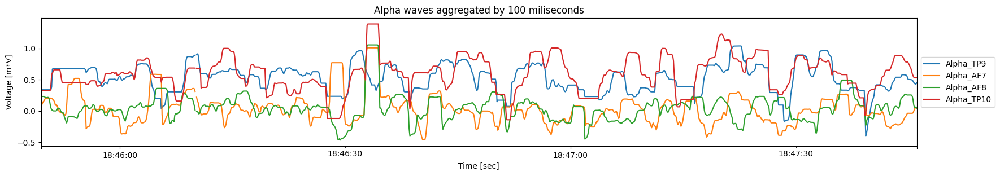

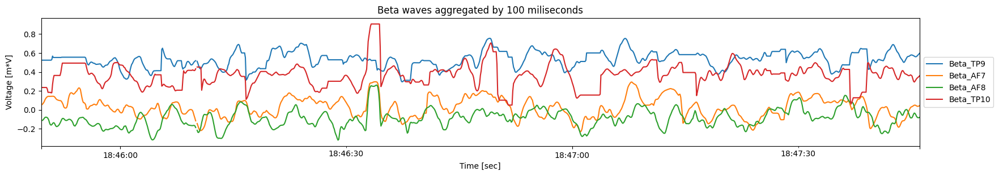

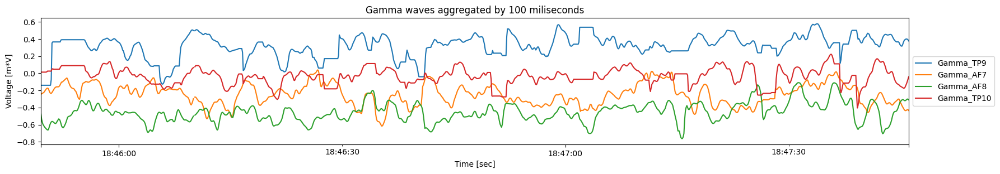

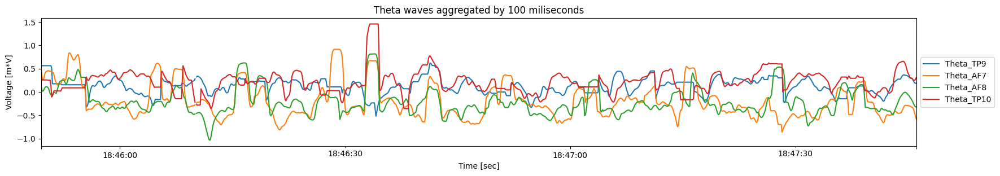

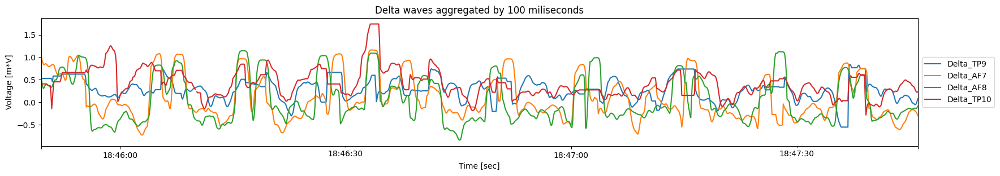

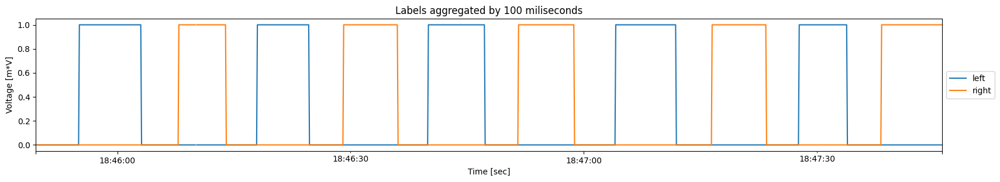

In [205]:
plt.rcParams["figure.figsize"] = (20,3)
plt.rcParams['figure.dpi'] = 100

def plot_eeg(wave_type_lst, waves_name):
    df.set_index(df.index)[wave_type_lst].plot()
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.xlabel('Time [sec]')
    plt.ylabel('Voltage [m*V]')
    if waves_name == 'Labels':
        plt.title(f'{waves_name} aggregated by 100 miliseconds')
    else:
        plt.title(f'{waves_name} waves aggregated by 100 miliseconds')
    plt.show();
    
def plot_labels(df):
    df.plot(x='left', y='right')
    plt.show();
    
plot_eeg(alphas, 'Alpha')
plot_eeg(betas, 'Beta')
plot_eeg(gammas, 'Gamma')
plot_eeg(thetas, 'Theta')
plot_eeg(deltas, 'Delta')
plot_eeg(['left', 'right'], 'Labels')

In [206]:
df.to_csv(result_instance_path, index=True)

In [207]:
print(f'Saved into {result_instance_path}')

Saved into intermediate_datafiles/motor_imagery/step1_result/med_2021-08-26--18-45-49_174012250194033688.csv


### Step 2: outlier detection and removal with GMMs

##### Butterworth Filter
The frequency response of the Butterworth filter is maximally flat (i.e. has no ripples) in the passband and rolls off towards zero in the stopband, hence its one of the most popular low pass filter.
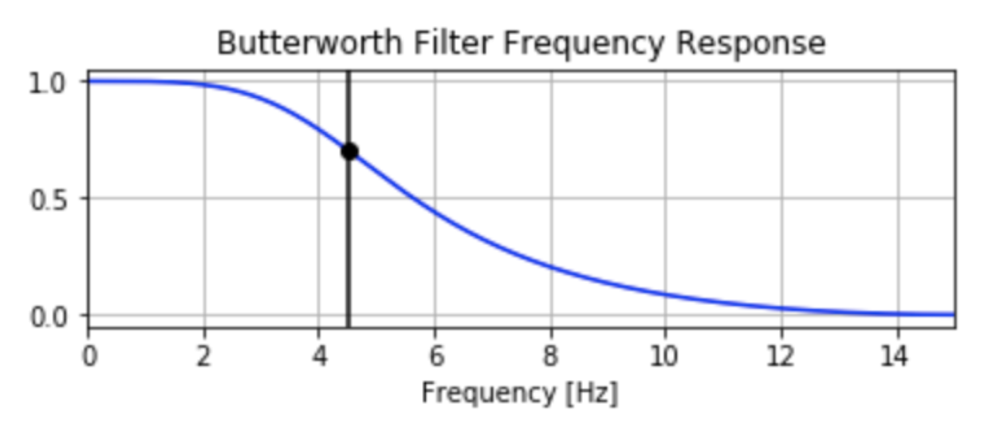

#### Nyquist Frequency
The term Nyquist is often used to describe the Nyquist sampling rate or the Nyquist frequency.
The Nyquist rate or frequency is the minimum rate at which a finite bandwidth signal needs to be sampled to retain all of the information. If a time series is sampled at regular time intervals dt, then the Nyquist rate is just 1/(2 dt ).


In [322]:
def mixture_model(df, col, n_components):
    # print('Applying mixture models')
    # Fit a mixture model to our data.
    data = df[df[col].notnull()][col]
    g = GaussianMixture(n_components, max_iter=100, n_init=1)
    reshaped_data = np.array(data.values.reshape(-1, 1))
    g.fit(reshaped_data)
    # Predict the probabilities
    probs = g.score_samples(reshaped_data)

    # Create the right data frame and concatenate the two.
    data_probs = pd.DataFrame(
        np.power(10, probs), index=data.index, columns=[col+'_mixture'])

    df = pd.concat([df, data_probs], axis=1)
    return df

def low_pass_filter(df, col, sampling_frequency, cutoff_frequency, order=5, phase_shift=True):
    amplitude = 0.5
    nyq = amplitude * sampling_frequency
    normal_cutoff = cutoff_frequency / nyq

    b, a = butter(order, normal_cutoff, btype='low', output='ba', analog=False)
    if phase_shift:
        df[col + '_lowpass'] = filtfilt(b, a, df[col])
    else:
        df[col + '_lowpass'] = lfilter(b, a, df[col])
    return df


df = pd.read_csv(result_instance_path, index_col=0)
df.index = pd.to_datetime(df.index)

for col in df.columns[:-2]:
    # print('Step 1: Outlier detection')
    # print(f'Measurement is now: {col}')
    try:
        df = mixture_model(df, col, 3)
    except ValueError:
        continue
    
    df.loc[df[f'{col}_mixture'] < 0.0005, col] = np.nan
    del df[col + '_mixture']
    
    # print('Step 2: Imputation')
    # print('Before interpolation, number of nans left should be > 0: ' + str(df[col].isna().sum()))
    # print('Also count amount of zeroes:' + str((df[col] == 0).sum()))
    df[col] = df[col].interpolate() #interpolating missing values
    df[col] = df[col].fillna(method='bfill') # And fill the initial data points if needed

    # check if all nan are filled in
    # print('Check, number of nans left should be 0: ' + str(df[col].isna().sum()))
    fs, cutoff = 30, 2
    df = low_pass_filter(df, col, fs, cutoff, order=10)
    df[col] = df[col + '_lowpass']
    del df[col + '_lowpass']
    
print('done.')

done.


# Visualize step 2 outliers detection

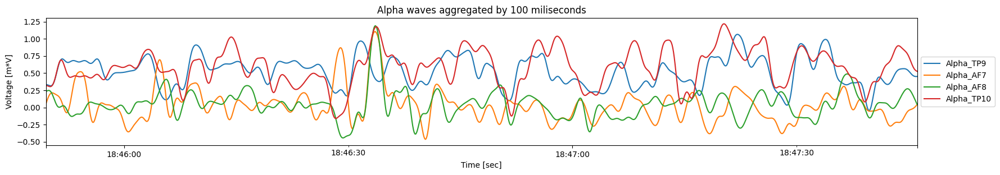

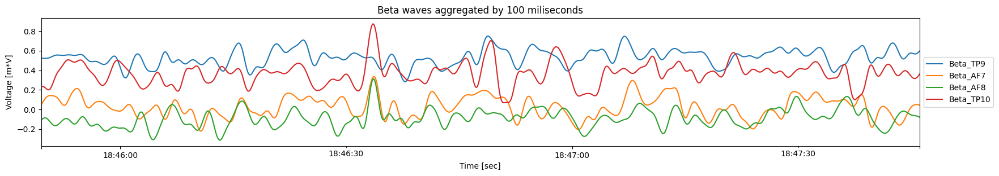

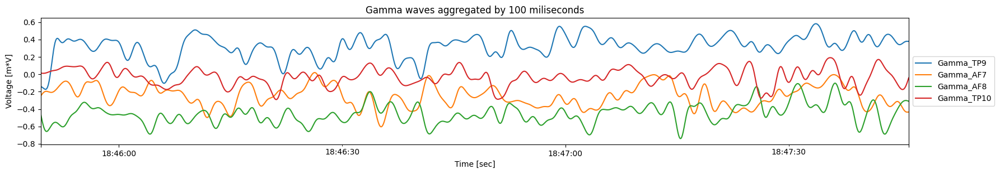

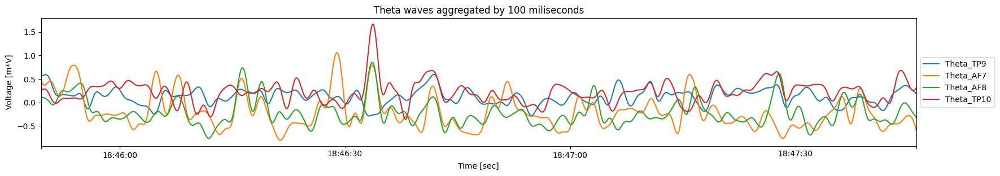

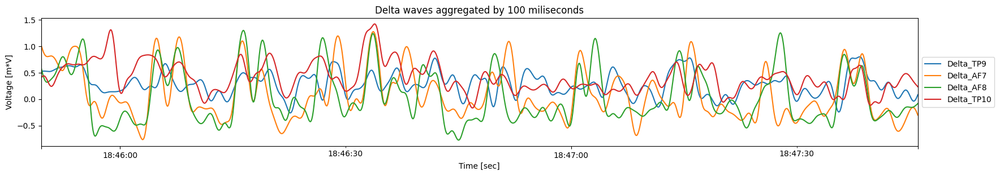

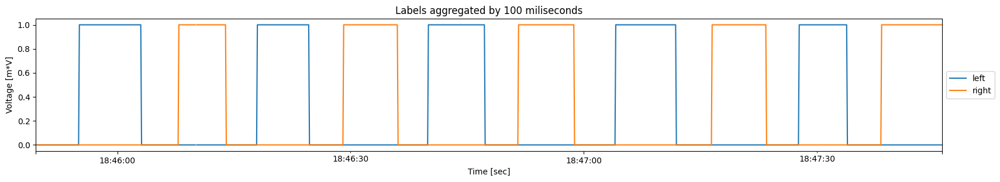

In [323]:
plt.rcParams["figure.figsize"] = (20,3)
plt.rcParams['figure.dpi'] = 100

def plot_eeg(wave_type_lst, waves_name):
    df.set_index(df.index)[wave_type_lst].plot()
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.xlabel('Time [sec]')
    plt.ylabel('Voltage [m*V]')
    if waves_name == 'Labels':
        plt.title(f'{waves_name} aggregated by 100 miliseconds')
    else:
        plt.title(f'{waves_name} waves aggregated by 100 miliseconds')
    plt.show();
    
def plot_labels(df):
    df.plot(x='left', y='right')
    plt.show();
    
plot_eeg(alphas, 'Alpha')
plot_eeg(betas, 'Beta')
plot_eeg(gammas, 'Gamma')
plot_eeg(thetas, 'Theta')
plot_eeg(deltas, 'Delta')
plot_eeg(['left', 'right'], 'Labels')

### Feature engineering

#### Reduce features number with PCA

In [363]:
n_pcs = 4
df2 = copy.deepcopy(df)
cols = df2.columns[:-3]

df_norm = copy.deepcopy(df2)
for col in cols:
    df_norm[col] = (df2[col] - df2[col].mean()) / (df2[col].max() - df2[col].min())

pca = PCA(n_components=n_pcs)
pca.fit(df_norm[cols])

new_values = pca.transform(df_norm[cols])

for comp in range(0, n_pcs):
    df2['pca_' +str(comp+1)] = new_values[:,comp]

#### Added 4 new features:

In [364]:
df2.head()

,Delta_TP9,Delta_AF7,Delta_AF8,Delta_TP10,Theta_TP9,Theta_AF7,Theta_AF8,Theta_TP10,Alpha_TP9,Alpha_AF7,...,Gamma_AF7,Gamma_AF8,Gamma_TP10,Elements,left,right,pca_1,pca_2,pca_3,pca_4
2021-08-26 18:45:49.518,0.528904,1.021892,0.593370,0.406748,0.562631,0.448328,0.113125,0.258024,0.337257,0.046810,...,-0.248256,-0.462037,0.013447,NaN,0.0,0.0,0.782521,-0.217533,-0.006769,-0.196357
2021-08-26 18:45:49.618,0.530063,0.975332,0.535598,0.422400,0.567166,0.419951,0.109739,0.268767,0.334188,0.080233,...,-0.236231,-0.504300,0.012351,NaN,0.0,0.0,0.770773,-0.222912,-0.008712,-0.235120
2021-08-26 18:45:49.718,0.531056,0.931721,0.480433,0.435053,0.572156,0.395181,0.106180,0.278199,0.330780,0.112350,...,-0.224957,-0.544276,0.011485,NaN,0.0,0.0,0.760095,-0.228673,-0.011038,-0.273098
2021-08-26 18:45:49.818,0.531634,0.893217,0.430871,0.442102,0.577638,0.376820,0.102237,0.285121,0.326849,0.141602,...,-0.215055,-0.579986,0.011038,NaN,0.0,0.0,0.751187,-0.235187,-0.013986,-0.309252
2021-08-26 18:45:49.918,0.531626,0.861385,0.389315,0.441657,0.583233,0.366740,0.097585,0.288436,0.322577,0.166668,...,-0.207010,-0.609838,0.011161,NaN,0.0,0.0,0.744234,-0.242446,-0.017924,-0.342443


In [365]:
def aggregate_value(data, window_size, aggregation_function):
    def get_slope(data):      
        times = np.array(range(0, len(data.index)))
        data = data.astype(np.float32)
        mask = ~np.isnan(data)
        if (len(data[mask]) == 0):
            return np.nan
        else:
            slope, _, _, _, _ = stats.linregress(times[mask], data[mask])
            return slope
    
    window = str(window_size) + 's'
    if aggregation_function == 'mean':
        return data.rolling(window, min_periods=window_size).mean()
    elif aggregation_function == 'max':
        return data.rolling(window, min_periods=window_size).max()
    elif aggregation_function == 'min':
        return data.rolling(window, min_periods=window_size).min()
    elif aggregation_function == 'median':
        return data.rolling(window, min_periods=window_size).median()
    elif aggregation_function == 'std':
        return data.rolling(window, min_periods=window_size).std()
    elif aggregation_function == 'slope':
        return data.rolling(window, min_periods=window_size).apply(get_slope)
    else:
        return np.nan

cols = df2.columns[:-7]
df_norm = copy.deepcopy(df2)

# perform the FastICA for all components.
ica = FastICA(n_components=len(cols))
ica.fit(df_norm[cols])
new_values = ica.transform(df_norm[cols])
for comp in range(0, len(cols)):
    df2['FastICA_' +str(comp+1)] = new_values[:,comp]

df2.head()

/Users/sofiapetryshyn/opt/anaconda3/envs/eeg/lib/python3.10/site-packages/sklearn/decomposition/_fastica.py:116: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


,Delta_TP9,Delta_AF7,Delta_AF8,Delta_TP10,Theta_TP9,Theta_AF7,Theta_AF8,Theta_TP10,Alpha_TP9,Alpha_AF7,...,FastICA_11,FastICA_12,FastICA_13,FastICA_14,FastICA_15,FastICA_16,FastICA_17,FastICA_18,FastICA_19,FastICA_20
2021-08-26 18:45:49.518,0.528904,1.021892,0.593370,0.406748,0.562631,0.448328,0.113125,0.258024,0.337257,0.046810,...,-0.148774,0.005535,0.016544,0.012692,-0.028136,-0.006015,0.009738,-0.011257,0.010143,-0.001879
2021-08-26 18:45:49.618,0.530063,0.975332,0.535598,0.422400,0.567166,0.419951,0.109739,0.268767,0.334188,0.080233,...,-0.147978,0.007748,0.013355,0.008746,-0.023223,-0.003354,0.009689,-0.014978,0.007659,-0.002654
2021-08-26 18:45:49.718,0.531056,0.931721,0.480433,0.435053,0.572156,0.395181,0.106180,0.278199,0.330780,0.112350,...,-0.147629,0.009801,0.010281,0.004959,-0.018601,-0.000962,0.009722,-0.018247,0.005431,-0.003239
2021-08-26 18:45:49.818,0.531634,0.893217,0.430871,0.442102,0.577638,0.376820,0.102237,0.285121,0.326849,0.141602,...,-0.148024,0.011504,0.007398,0.001484,-0.014579,0.000900,0.009854,-0.020652,0.003669,-0.003469
2021-08-26 18:45:49.918,0.531626,0.861385,0.389315,0.441657,0.583233,0.366740,0.097585,0.288436,0.322577,0.166668,...,-0.149247,0.012696,0.004752,-0.001559,-0.011391,0.002022,0.010093,-0.021882,0.002527,-0.003229


#### Fourier transformation:
Freq and time domain features for ws of 1 sec.

In [366]:
milliseconds_per_instance = (df_norm.index[1] - df_norm.index[0]).microseconds/1000
ws = int(float(1000)/milliseconds_per_instance)
fs = 100 # sample frequency

In [367]:
freqs = (fs * np.fft.rfftfreq(int(ws))).round(3)
freqs

array([ 0., 10., 20., 30., 40., 50.])

#### Do aggregation for each window

In [368]:
# for window size = 1 sec, do:
for agg in ['mean', 'std', 'max', 'min', 'median', 'slope']:
    for col in cols:                   
        df2[col + '_temp_' + agg + '_ws_' + str(ws)] = aggregate_value(df2[col], ws, agg)

/var/folders/gd/2tcvq2ss7390zpx1fn2lfry40000gn/T/ipykernel_8732/1678901644.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  df2[col + '_temp_' + agg + '_ws_' + str(ws)] = aggregate_value(df2[col], ws, agg)


In [370]:
def find_fft_transformation(df):
    transformation = np.fft.rfft(df, len(df))
    real_ampl = transformation.real
    max_freq = freqs[np.argmax(real_ampl[0:len(real_ampl)])]
    freq_weigthed = float(np.sum(freqs * real_ampl)) / np.sum(real_ampl)

    PSD = np.divide(np.square(real_ampl), float(len(real_ampl)))
    PSD_pdf = np.divide(PSD, np.sum(PSD))

    if np.count_nonzero(PSD_pdf) == PSD_pdf.size:
        pse = -np.sum(np.log(PSD_pdf) * PSD_pdf)
    else:
        pse = 0

    real_ampl = np.insert(real_ampl, 0, max_freq)
    real_ampl = np.insert(real_ampl, 0, freq_weigthed)
    row = np.insert(real_ampl, 0, pse)
    temp_list.append(row)
    return 0


for col in cols:
    temp_list, frequencies = [], []
    collist = []
    collist.append(col + '_max_freq_ws_' + str(ws))
    collist.append(col + '_freq_weighted_ws_' + str(ws))
    collist.append(col + '_pse_ws_' + str(ws))
    collist = collist + [col + '_freq_' + str(freq) + '_Hz_ws_' + str(ws) for freq in freqs]

    # rolling statistics to calculate frequencies, per window size. 
    # Pandas Rolling method can only return one aggregation value. 
    # Therefore values are not returned but stored in temp class variable 'temp_list'.
    df2[col].rolling(ws + 1).apply(find_fft_transformation)

    # Pad the missing rows with nans
    frequencies = np.pad(np.array(temp_list), ((ws, 0), (0, 0)), 'constant', constant_values=np.nan)

    # add new freq columns to frame
    df2[collist] = pd.DataFrame(frequencies, index=df2.index)


/Users/sofiapetryshyn/opt/anaconda3/envs/eeg/lib/python3.10/site-packages/pandas/core/frame.py:3641: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  self[k1] = value[k2]


In [375]:
# Now we only take a certain percentage of overlap in the windows, otherwise our training examples will be too much alike.
# The percentage of overlap we allow:
window_overlap = 0.5
# we do this for the biggest ws
skip_points = int((1-window_overlap) * ws)
df2 = df2.iloc[::skip_points,:]

#apparently the first two rows are NaNs so delete those.
df2 = df2.iloc[2:]

In [376]:
df2.head()

,Delta_TP9,Delta_AF7,Delta_AF8,Delta_TP10,Theta_TP9,Theta_AF7,Theta_AF8,Theta_TP10,Alpha_TP9,Alpha_AF7,...,Gamma_AF8_freq_50.0_Hz_ws_10,Gamma_TP10_max_freq_ws_10,Gamma_TP10_freq_weighted_ws_10,Gamma_TP10_pse_ws_10,Gamma_TP10_freq_0.0_Hz_ws_10,Gamma_TP10_freq_10.0_Hz_ws_10,Gamma_TP10_freq_20.0_Hz_ws_10,Gamma_TP10_freq_30.0_Hz_ws_10,Gamma_TP10_freq_40.0_Hz_ws_10,Gamma_TP10_freq_50.0_Hz_ws_10
2021-08-26 18:46:07.518,0.223135,1.054808,0.961207,0.686825,0.135926,0.527353,0.118497,-0.170185,0.283112,0.091194,...,-0.015267,0.010517,2.085818,20.0,-1.666389,-0.025274,-0.024692,-0.024844,-0.024917,-0.024945
2021-08-26 18:46:15.018,0.150350,-0.119223,-0.267885,0.463333,0.138024,-0.377090,-0.306440,0.352289,0.668205,0.082776,...,0.009756,0.027627,-2.695601,10.0,-2.052757,0.110060,0.040738,0.028541,0.024630,0.023281
2021-08-26 18:46:22.518,-0.248523,-0.431369,-0.221827,0.069514,0.215800,-0.515203,-0.328182,-0.055220,0.676554,-0.046691,...,-0.101498,0.469817,11.567709,50.0,-1.106854,-0.227045,-0.152452,-0.142190,-0.139012,-0.137927
2021-08-26 18:46:30.018,0.057711,0.292638,-0.312387,0.152159,-0.020257,-0.120845,-0.458087,-0.069575,0.207053,0.033406,...,0.052402,0.161808,7.726013,50.0,-1.091165,-0.093130,-0.078553,-0.075756,-0.074854,-0.074542
2021-08-26 18:46:37.518,0.353187,0.732492,0.131949,0.515288,0.128809,-0.411347,-0.212329,-0.075046,0.464330,0.087584,...,0.085284,1.315687,20.671195,0.0,0.158058,0.038913,0.059622,0.063069,0.064181,0.064565


### Conclusion:
1. We created 4 PCA features.
    * Well-known linear transformation method.
2. 20 FastICA features
    *  Independent component analysis (ICA) is a recently developed method in which the goal is to find a linear representation of non-Gaussian data so that the components are statistically independent, or as independent as possible. Such a representation seems to capture the essential structure of the data in many applications, including feature extraction and signal separation.
3. For each EEG channel statistic values, such us mean, max, min, slope
4. For each EEG channel we did Fourier transformation, where we distributed the signal into a few frequancies sin functions.
    * The frequancies are 0, 10, 20, 30, 40, 50

# Prepare all the data the same way
1. Pre-process dataset
2. Add more features
3. Store the data in the directory

I will do it in a seperate notebook.
# Continue work
1. Read all the processed data
2. Train a model to classify left and right hand thoughts.

## Set a path and read all the data frames

In [377]:
RESULT2_PATH = Path('./intermediate_datafiles/motor_imagery/step2_result/')

In [459]:
all_datasets = []

for instance in os.scandir(RESULT2_PATH): # go through all instances of experiments
    instance_path = instance.path
    dataset = pd.read_csv(instance_path, index_col=0)
    dataset.index = pd.to_datetime(dataset.index)
    all_datasets.append(dataset)

In [460]:
all_datasets[0].head()

,Delta_TP9,Delta_AF7,Delta_AF8,Delta_TP10,Theta_TP9,Theta_AF7,Theta_AF8,Theta_TP10,Alpha_TP9,Alpha_AF7,...,Gamma_AF8_freq_50.0_Hz_ws_10,Gamma_TP10_max_freq_ws_10,Gamma_TP10_freq_weighted_ws_10,Gamma_TP10_pse_ws_10,Gamma_TP10_freq_0.0_Hz_ws_10,Gamma_TP10_freq_10.0_Hz_ws_10,Gamma_TP10_freq_20.0_Hz_ws_10,Gamma_TP10_freq_30.0_Hz_ws_10,Gamma_TP10_freq_40.0_Hz_ws_10,Gamma_TP10_freq_50.0_Hz_ws_10
2021-08-26 18:45:50.518,0.523932,0.810661,0.333065,0.300896,0.548450,0.442986,0.031311,0.199553,0.348203,0.209879,...,0.099531,0.067277,-4.216408,0.0,0.165176,0.012408,-0.003306,-0.005406,-0.006053,-0.006274
2021-08-26 18:45:51.018,0.538053,0.812173,0.403109,0.252402,0.340310,0.422040,-0.045433,0.041202,0.528740,0.179946,...,-0.024832,0.093769,-10.600455,0.0,0.276599,-0.015185,-0.014266,-0.014345,-0.014383,-0.014398
2021-08-26 18:45:51.518,0.575755,0.723806,0.519948,0.396758,0.160797,0.234958,0.017880,-0.016308,0.694065,0.115380,...,-0.048346,0.045691,-5.592143,0.0,0.413797,-0.020556,-0.012956,-0.012310,-0.012128,-0.012068
2021-08-26 18:45:52.018,0.600679,0.580983,0.722848,0.543269,0.152730,0.129260,0.188070,0.042360,0.686697,-0.032117,...,0.000119,0.019033,-3.716436,0.0,0.531645,0.000342,-0.011282,-0.012685,-0.013112,-0.013257
2021-08-26 18:45:52.518,0.613216,0.561928,0.796917,0.626799,0.168271,0.272587,0.250525,0.086423,0.656130,-0.047721,...,0.025777,0.030981,-4.969012,0.0,0.703383,-0.014912,-0.019926,-0.020435,-0.020583,-0.020633


In [462]:
for i, df in enumerate(all_datasets):
    df_labels = []
    df.drop(['Elements',], axis=1, inplace=True)
    for row in df.iterrows():
        row = row[1]  
        if row['left'] == 1 and row['right'] == 0:
            df_labels.append(1)
        elif row['left'] == 0 and row['right'] == 1:
            df_labels.append(2)
        else:
            df_labels.append(3)
    df['label'] = df_labels
    df.drop(['left', 'right'], axis=1, inplace=True)
    print('processed')

processed
processed
processed
processed
processed
processed
processed
processed


### Example:

In [463]:
print('Left: ', all_datasets[0][all_datasets[0]['label'] == 1]['label'].count(),
      'Right: ', all_datasets[0][all_datasets[0]['label'] == 2]['label'].count(),
      'Relaxed: ', all_datasets[0][all_datasets[0]['label'] == 3]['label'].count())

Left:  72 Right:  70 Relaxed:  90


# Random Forest Classifier

#### Remove unnecessary features

In [464]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

In [514]:
X, y = all_datasets[0][all_datasets[0].columns[:-1]], all_datasets[0][all_datasets[0].columns[-1]]
for df in all_datasets[1:]:
    X = pd.concat([X, df[df.columns[:-1]]], ignore_index=True)
    y = pd.concat([y, df[df.columns[-1]]], ignore_index=True)

X.shape, y.shape

((1950, 344), (1950,))

In [515]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [516]:
model = RandomForestClassifier()
rfe = RFE(model, n_features_to_select=20, step=1)
fit = rfe.fit(X_train, y_train)
print("Num Features: %s" % (fit.n_features_))
# print("Selected Features: %s" % (fit.support_))
# print("Feature Ranking: %s" % (fit.ranking_))

Num Features: 20


### Train RFC only using all the features

In [517]:
model.fit(X_train, y_train)
preds = model.predict(X_test)

In [518]:
print ('Accuracy of RFC on training data: ', model.score(X_train, y_train))
print('Accuracy of RFC on test data: ', round(model.score(X_test, y_test), 2))

Accuracy of RFC on training data:  1.0
Accuracy of RFC on test data:  0.86


### Train RFC only using 20 the most important features (feature importance decided by sklearn)

In [519]:
features = list(pd.DataFrame(model.feature_importances_, index=X_train.columns).sort_values(by=0, ascending=False).index)[20:]
X_train20 = X_train.drop(features, axis=1)
X_test20 = X_test.drop(features, axis=1)

In [520]:
model = RandomForestClassifier()
model.fit(X_train20, y_train)
preds = model.predict(X_test20)
print ('Accuracy of RFC on training data: ', model.score(X_train20, y_train))
print('Accuracy of RFC on test data: ', round(model.score(X_test20, y_test), 2))

Accuracy of RFC on training data:  1.0
Accuracy of RFC on test data:  0.86


### Train RFC only using 20 the most important features (feature importance decided by RFE)

In [521]:
zipped = zip(X.columns, fit.ranking_)
features2 = [i[0] for i in sorted(zipped, key=lambda element: element[1])][20:]
X_train20_2 = X_train.drop(features2, axis=1)
X_test20_2 = X_test.drop(features2, axis=1)

In [522]:
model = RandomForestClassifier()
model.fit(X_train20_2, y_train)
preds = model.predict(X_test20_2)
print ('Accuracy of RFC on training data: ', model.score(X_train20_2, y_train))
print('Accuracy of RFC on test data: ', round(model.score(X_test20_2, y_test), 2))

Accuracy of RFC on training data:  1.0
Accuracy of RFC on test data:  0.85


### Heatmaps of correlation

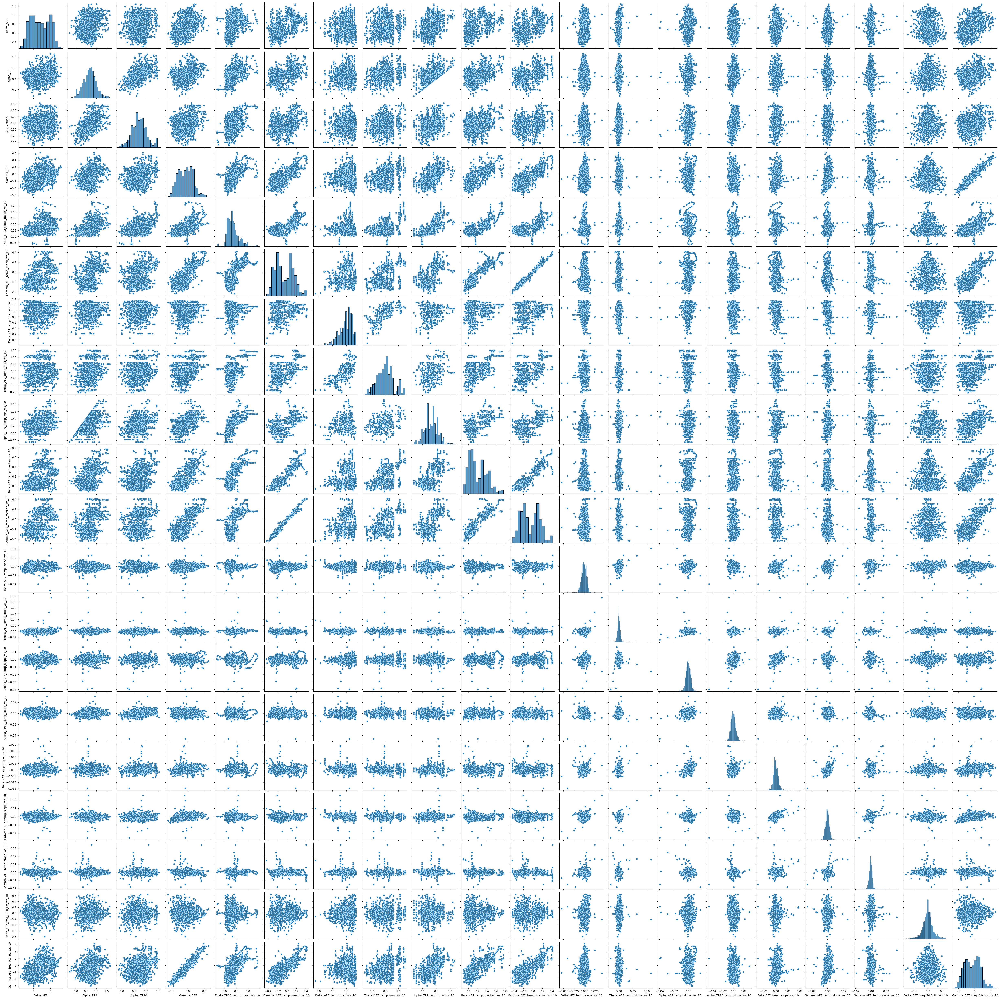

In [527]:
# ! pip install seaborn
import seaborn
seaborn.pairplot(X_train20)

### Top features defined by sklearn

<AxesSubplot:>

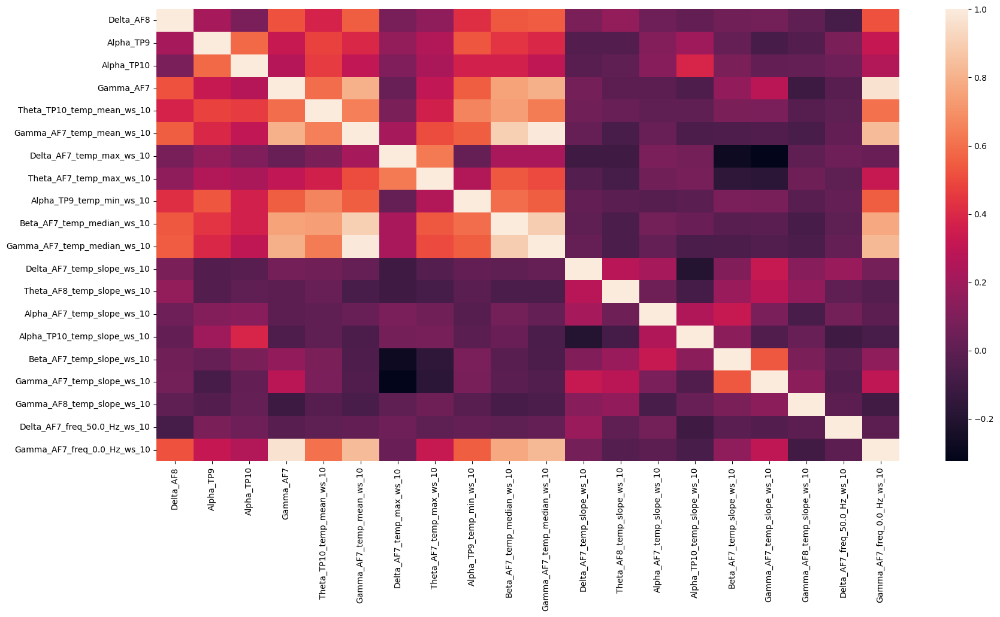

In [531]:
plt.rcParams["figure.figsize"] = (20,10)
plt.rcParams['figure.dpi'] = 100
seaborn.heatmap(X_train20.corr(),
                xticklabels=X_train20.columns,
                yticklabels=X_train20.columns)

### Top features defined by RFE

<AxesSubplot:>

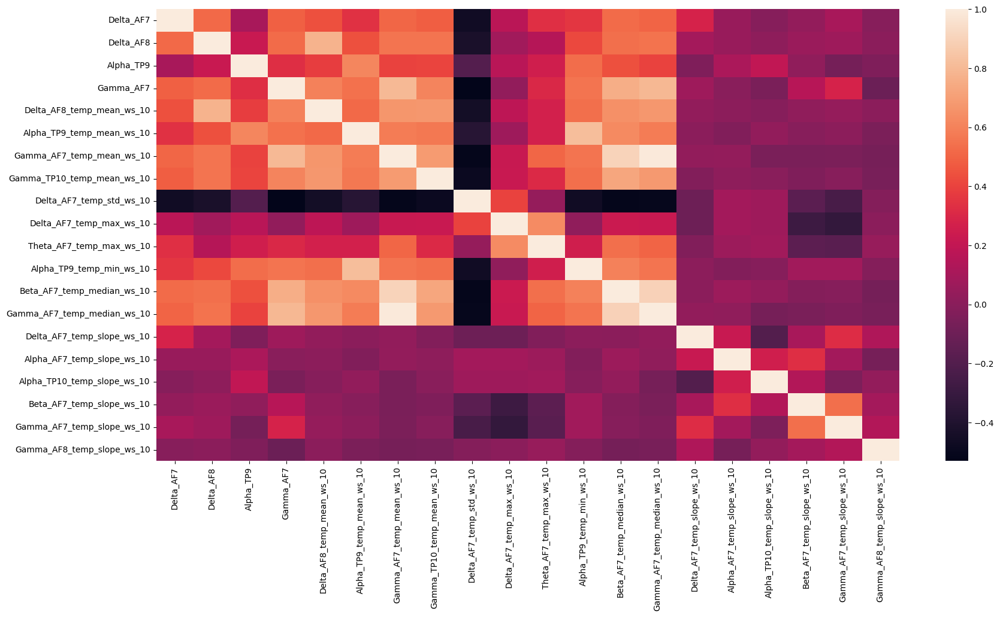

In [532]:
seaborn.heatmap(X_train20_2.corr(),
                xticklabels=X_train20_2.columns,
                yticklabels=X_train20_2.columns)

### Insights:
    * From the plots above we can see that sklearn feature importance shows better correllation among the features selected than RFE.
    * At the first plot with ditribution of the featueres we can see that correlated features form a vertical pattern.
On these data features were trained Random Forest Classifier model and it performed with a great accuracy.

# Conclusion:
1. So we have built a Random Forest Classifier running experiments
    * using all the features that we have about our signal (344 features), getting accuracy 87%
    * using 20 the features that were defined as the most important after sklearn library RFC was fitted on the data (20 features), getting accuracy 86%
    * using 20 the features that were defined as the most important after sklearn library RFE module was fitted on the data (20 features), getting accuracy 85%